In [42]:


import numpy as np


In [43]:
import math
from time import sleep
reach_threshold = 0.1
dis_threshold = 0.1
def convert_angle(delta_x,delta_y):
    if(delta_x == 0):      #special case when x = 0 
        if(delta_y == 0):          #reach the destination
            return None
        elif(delta_y > 0):     
            return 90
        else:
            return -90
    temp = delta_y / delta_x
    
    if(delta_x > 0): #in case from -90 to 90 degree
        return math.degrees(math.atan(temp))
    else:
        
        if(delta_y > 0):  #case for 90 to 180 degree
            return 180 + math.degrees(math.atan(temp))
        else:       #case for -180 to -90 degree
            return math.degrees(math.atan(temp)) + 180 - 360
        
        
def update_info_straight(curr_x,curr_y,curr_angle, time):    #for keep space
    speed = 1       #currently defalut 1, can use calibration to change that
    curr_x = curr_x + math.cos(math.radians(curr_angle)) * time * speed
    curr_y = curr_y + math.sin(math.radians(curr_angle)) * time * speed

    return curr_x,curr_y

def reach_destination(curr_x, x, curr_y, y):  
    distance_apart = math.sqrt((curr_x - x)**2 + (curr_y - y)**2)       #use to calculate the distance from the destination to current lcoation
    
    if(distance_apart < dis_threshold): #within a range, then it mean it is close to the destination, then it return true.
        return True
    else:
        return False
    
def check_angle(angle):     #use to convert the angle to be between -180 to 180 degree
    if(angle > 180):
        return -180 + angle - 180
    elif(angle < -180):
        return 180 + angle + 180
    else:
        return angle

In [55]:
curr_x = -2          #use to keep track on the x of the car current status
curr_y = 0        #use to keep track on the y of the car current status
curr_angle = 0      #use to keep track on the angle of the car current status, range from -180 to 180. 0 indicate straight
des_x = 1
des_y = 0
spin_time = 0.5

In [72]:
import math

def has_obstacle(x, y, angle):
    if x <= -1:
        if y + (-1-x) * math.tan(angle) > 1 :
            return False
        if y + (-1-x) * math.tan(angle) < -1 :
            return False
        dis = (-1-x)/ math.cos(angle)
    else:
        return False
    
    if dis < 0.5:
        return True
    else:
        return False

In [77]:

    
def update(prob_blocked):
    global curr_x, curr_y, curr_angle 
    global des_x, des_y, spin_time
    
    
    if not des_x or not des_y:
        print("hahaha")
    
    if reach_destination(curr_x, des_x, curr_y, des_y):
        #camera.unobserve(update, names='value')
        print("stop")
        #robot.stop()

    print("current location", curr_x, curr_y, curr_angle)
    x_array.append(curr_x)
    y_array.append(curr_y)
    # we apply the `softmax` function to normalize the output vector so it sums to 1 (which makes it a probability distribution)
    
 
    
    if not has_obstacle(curr_x, curr_y, curr_angle): #if no object
        target_angle = convert_angle(des_x - curr_x, des_y - curr_y)
        angle_diff = target_angle - curr_angle
        print(target_angle)
        if abs(angle_diff) > 0.02: 
                #not pointing at the correct angle
                #adjust to the left while going straight if angle is negative and right if angle is positive

            #time_to_turn = spin_time / abs(angle_different)     #calculate how long does the spin need to be
            curr_x, curr_y = update_info_straight(curr_x,curr_y,curr_angle, 0.01) 
            #sleep(time_to_turn)     #sleep to wait until the car turn enough
            curr_angle = target_angle    #x and y did not change, only the angle change to the target value in this case.
        else:
            #go straight 
            #straight()
            #sleep(0.1)
            curr_x, curr_y = update_info_straight(curr_x,curr_y,curr_angle, 0.01)   

            
    else:
        #spin_left()
        #sleep(0.1)
        curr_angle = check_angle(curr_angle + 0.5)  #make sure the angle is between -180 to 180 degree
        #straight()
        #sleep(0.5)
        #curr_x, curr_y = update_info_straight(curr_x, curr_y,curr_angle,0.1)
        
    
        
        


In [78]:
line_x_array = []
line_y_array = []
for i in (-1, 1, 0.00001):
    line_x_array.append(-1)
    line_y_array.append(i)
    
    

In [79]:
curr_x = -2          #use to keep track on the x of the car current status
curr_y = 0        #use to keep track on the y of the car current status
curr_angle = 0      #use to keep track on the angle of the car current status, range from -180 to 180. 0 indicate straight
des_x = 1
des_y = 0
spin_time = 0.5
x_array = []
y_array = []
prob = 0.3

for i in range(100000):
    prob = 0.3
    
    
    update(prob)

hahaha
current location -2 0 0
0.0
hahaha
current location -1.99 0.0 0
0.0
hahaha
current location -1.98 0.0 0
0.0
hahaha
current location -1.97 0.0 0
0.0
hahaha
current location -1.96 0.0 0
0.0
hahaha
current location -1.95 0.0 0
0.0
hahaha
current location -1.94 0.0 0
0.0
hahaha
current location -1.93 0.0 0
0.0
hahaha
current location -1.92 0.0 0
0.0
hahaha
current location -1.91 0.0 0
0.0
hahaha
current location -1.9 0.0 0
0.0
hahaha
current location -1.89 0.0 0
0.0
hahaha
current location -1.88 0.0 0
0.0
hahaha
current location -1.8699999999999999 0.0 0
0.0
hahaha
current location -1.8599999999999999 0.0 0
0.0
hahaha
current location -1.8499999999999999 0.0 0
0.0
hahaha
current location -1.8399999999999999 0.0 0
0.0
hahaha
current location -1.8299999999999998 0.0 0
0.0
hahaha
current location -1.8199999999999998 0.0 0
0.0
hahaha
current location -1.8099999999999998 0.0 0
0.0
hahaha
current location -1.7999999999999998 0.0 0
0.0
hahaha
current location -1.7899999999999998 0.0 0
0.0


current location -1.0041236087893115 0.034212837107112454 16.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 17.303783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 17.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 18.303783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 18.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 19.303783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 19.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 20.303783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 20.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 21.303783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 21.803783660804346
hahaha
current location -1.0041236087893115 0.034212837107112454 22.303783660804346

hahaha
current location -1.001772084968659 0.05203097049083295 35.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 36.05724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 36.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 37.05724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 37.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 38.05724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 38.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 39.05724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 39.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 40.05724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 40.55724140511754
hahaha
current location -1.001772084968659 0.05203097049083295 41.05724140511754
hahaha
current location -1.0

-1.375343388332135
hahaha
current location 0.7995473564105738 0.004813150774620755 -1.3724398499078723
-1.3754881956900422
hahaha
current location 0.8095444876743777 0.0045736377389083635 -1.3724398499078723
-1.3756482050885817
hahaha
current location 0.8195416189381816 0.004334124703195972 -1.3724398499078723
-1.37582594303684
hahaha
current location 0.8295387502019854 0.00409461166748358 -1.3724398499078723
-1.3760245287370823
hahaha
current location 0.8395358814657893 0.003855098631771189 -1.3724398499078723
-1.3762478587123823
hahaha
current location 0.8495330127295931 0.003615585596058798 -1.3724398499078723
-1.376500865034858
hahaha
current location 0.859530143993397 0.003376072560346407 -1.3724398499078723
-1.3767898838211303
hahaha
current location 0.8695272752572009 0.0031365595246340156 -1.3724398499078723
-1.3771231931374488
hahaha
current location 0.8795244065210047 0.0028970464889216244 -1.3724398499078723
-1.377511818718238
hahaha
current location 0.8895215377848086 0.002

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.009482

101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
curre

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.009482

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop


101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.009482

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.009482

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.99250863711

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.001991

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
curre

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
curre

161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop


101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
curren

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop


-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
curren

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
cu

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -

hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.990517628606

current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.00749136288409

-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop


current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.009482

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -

current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362

hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.

current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.9980089914901573 0.009799790054574322 -18.515615821645895
-78.515615821646
hahaha
stop
current location 1.007491362884094 0.006624158975961936 -78.515615821646
-138.5156158216456
hahaha
stop
current location 1.0094823713939367 -0.0031756310786123978 -138.5156158216456
161.48438417835385
hahaha
stop
current location 1.0019910085098427 -0.009799790054574379 161.48438417835385
101.48438417835395
hahaha
stop
current location 0.9925086371159059 -0.006624158975961948 101.48438417835395
41.484384178354034
hahaha
stop
current location 0.9905176286060632 0.0031756310786123874 41.484384178354034
-18.515615821645895
hahaha
stop
current location 0.998008991490

In [80]:
print(x_array)

[-2, -1.99, -1.98, -1.97, -1.96, -1.95, -1.94, -1.93, -1.92, -1.91, -1.9, -1.89, -1.88, -1.8699999999999999, -1.8599999999999999, -1.8499999999999999, -1.8399999999999999, -1.8299999999999998, -1.8199999999999998, -1.8099999999999998, -1.7999999999999998, -1.7899999999999998, -1.7799999999999998, -1.7699999999999998, -1.7599999999999998, -1.7499999999999998, -1.7399999999999998, -1.7299999999999998, -1.7199999999999998, -1.7099999999999997, -1.6999999999999997, -1.6899999999999997, -1.6799999999999997, -1.6699999999999997, -1.6599999999999997, -1.6499999999999997, -1.6399999999999997, -1.6299999999999997, -1.6199999999999997, -1.6099999999999997, -1.5999999999999996, -1.5899999999999996, -1.5799999999999996, -1.5699999999999996, -1.5599999999999996, -1.5499999999999996, -1.5399999999999996, -1.5299999999999996, -1.5199999999999996, -1.5099999999999996, -1.4999999999999996, -1.4999999999999996, -1.4900003807693578, -1.4900003807693578, -1.480000761538716, -1.480000761538716, -1.47000113

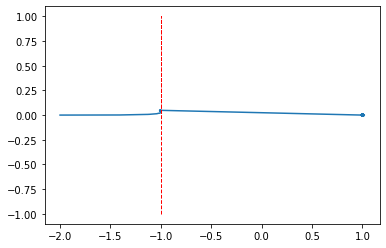

In [81]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(x_array, y_array, '-')
plt.plot(line_x_array, line_y_array,color='red',linewidth=1,linestyle='--')

In [5]:
def funcc(x, y):
    x = x + 1
    y = y + 1
    return x,y

In [6]:
a = 1
b = 1
a, b = funcc(a, b)

In [7]:
print(a)

2


In [69]:
math.tan(2)

-2.185039863261519